In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import os
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from einops import rearrange
from einops.layers.torch import Rearrange
import torch.cuda.amp as amp  # For mixed precision training
#import torch_xla.core.xla_model as xm  # For TPU support (if applicable)

In [2]:
# Helper function
def pair(t):
    return t if isinstance(t, tuple) else (t, t)

In [3]:
# FeedForward Module
class FeedForward(nn.Module):
    def __init__(self, dim, hidden_dim, dropout=0.):
        super().__init__()
        self.net = nn.Sequential(
            nn.LayerNorm(dim),
            nn.Linear(dim, hidden_dim),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, dim),
            nn.Dropout(dropout)
        )

    def forward(self, x):
        return self.net(x)

In [4]:
class Attention(nn.Module):
    def __init__(self, dim, heads=8, dim_head=64, dropout=0.):
        super().__init__()
        inner_dim = dim_head * heads
        project_out = not (heads == 1 and dim_head == dim)

        self.heads = heads
        self.scale = dim_head ** -0.5

        self.norm = nn.LayerNorm(dim)
        self.attend = nn.Softmax(dim=-1)
        self.dropout = nn.Dropout(dropout)

        self.to_qkv = nn.Linear(dim, inner_dim * 3, bias=False)

        self.to_out = nn.Sequential(
            nn.Linear(inner_dim, dim),
            nn.Dropout(dropout)
        ) if project_out else nn.Identity()

    def forward(self, x):
            x = self.norm(x)
            qkv = self.to_qkv(x).chunk(3, dim=-1)
            q, k, v = map(lambda t: rearrange(t, 'b n (h d) -> b h n d', h=self.heads), qkv)

            dots = torch.matmul(q, k.transpose(-1, -2)) * self.scale
            attn = self.attend(dots)
            attn = self.dropout(attn)

            out = torch.matmul(attn, v)
            out = rearrange(out, 'b h n d -> b n (h d)')
            return self.to_out(out)


In [5]:
# Transformer Module with Gradient Checkpointing
class Transformer(nn.Module):
    def __init__(self, dim, depth, heads, dim_head, mlp_dim, dropout=0.):
        super().__init__()
        self.norm = nn.LayerNorm(dim)
        self.layers = nn.ModuleList([])
        for _ in range(depth):
            self.layers.append(nn.ModuleList([
                Attention(dim, heads=heads, dim_head=dim_head, dropout=dropout),
                FeedForward(dim, mlp_dim, dropout=dropout)
            ]))

    def forward(self, x):
        for attn, ff in self.layers:
            x = attn(x) + x
            x = ff(x) + x
        return self.norm(x)



In [6]:
# StagedViT with Reduced Complexity
class StagedViT(nn.Module):
    def __init__(self, *, image_size, patch_size, dims, depths, heads, mlp_dims, channels=3, dim_head=64, dropout=0., emb_dropout=0.):
        super().__init__()
        image_height, image_width = pair(image_size)
        self.patch_height, self.patch_width = pair(patch_size)

        assert image_height % self.patch_height == 0 and image_width % self.patch_width == 0, 'Image dimensions must be divisible by the patch size.'

        num_patches = (image_height // self.patch_height) * (image_width // self.patch_width)
        patch_dim = channels * self.patch_height * self.patch_width

        self.to_patch_embedding = nn.Sequential(
            Rearrange('b c (h p1) (w p2) -> b (h w) (p1 p2 c)', p1=self.patch_height, p2=self.patch_width),
            nn.LayerNorm(patch_dim),
            nn.Linear(patch_dim, dims[0]),
            nn.LayerNorm(dims[0]),
        )

        self.pos_embedding = nn.Parameter(torch.randn(1, num_patches, dims[0]))
        self.dropout = nn.Dropout(emb_dropout)

        self.stage1 = Transformer(dims[0], depths[0], heads[0], dim_head, mlp_dims[0], dropout)

        self.stages = nn.ModuleList()
        for i in range(1, 4):
            stage = nn.Sequential(
                nn.LayerNorm(dims[i - 1]),
                nn.Linear(dims[i - 1], dims[i]),
                Rearrange(
                    'b (h w) d -> b d h w',
                    h=image_height // self.patch_height // (2 ** (i - 1)),
                    w=image_width // self.patch_width // (2 ** (i - 1))
                ),
                nn.Conv2d(dims[i], dims[i], kernel_size=2, stride=2),
                Rearrange('b d h w -> b (h w) d'),
                nn.LayerNorm(dims[i]),
            )
            transformer = Transformer(dims[i], depths[i], heads[i], dim_head, mlp_dims[i], dropout)
            self.stages.append(nn.Sequential(stage, transformer))


    def forward(self, x):
      b, c, h, w = x.shape
      feats = []

      x = self.to_patch_embedding(x)
      x += self.pos_embedding[:, :x.shape[1]]
      x = self.dropout(x)

      x = self.stage1(x)
      h_patches = h // self.patch_height
      w_patches = w // self.patch_width

      x_stage1 = x.transpose(1, 2).reshape(b, -1, h_patches, w_patches)
      feats.append(x_stage1)

      for i, stage in enumerate(self.stages):
          b, c_, h_, w_ = feats[-1].shape
          x = feats[-1].flatten(2).transpose(1, 2)
          x = stage(x)
          new_h, new_w = h_ // 2, w_ // 2
          x = x.transpose(1, 2).reshape(b, -1, new_h, new_w)
          feats.append(x)

      return feats



In [7]:
# Difference Module and Decoder (unchanged)
class MLPBlock(nn.Module):
    def __init__(self, in_dim, out_dim):
        super().__init__()
        self.fc = nn.Linear(in_dim, out_dim)
        self.relu = nn.ReLU()
        self.bn = nn.BatchNorm2d(out_dim)

    def forward(self, x):
        x = self.fc(x.permute(0, 2, 3, 1))
        x = self.relu(x)
        x = x.permute(0, 3, 1, 2)
        x = self.bn(x)
        return x

In [8]:
class UpsampleConvLayer(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, scale_factor=2, mode="bilinear"):
        super().__init__()
        self.upsample = nn.Upsample(scale_factor=scale_factor, mode=mode, align_corners=True)
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=1, padding=kernel_size // 2)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.upsample(x)
        x = self.conv(x)
        x = self.bn(x)
        x = self.relu(x)
        return x

In [9]:
class MultiStageUpsampler(nn.Module):
    def __init__(self, embed_dim):
        super().__init__()
        self.up1 = UpsampleConvLayer(embed_dim, embed_dim, scale_factor=2)
        self.up2 = UpsampleConvLayer(embed_dim, embed_dim, scale_factor=2)
        self.up3 = UpsampleConvLayer(embed_dim, embed_dim, scale_factor=2)

    def forward(self, x):
        x = self.up1(x)
        x = self.up2(x)
        x = self.up3(x)
        return x

class MultiStageUpsampler2(nn.Module):
    def __init__(self, embed_dim):
        super().__init__()
        self.up1 = UpsampleConvLayer(embed_dim, embed_dim, scale_factor=2)
        self.up2 = UpsampleConvLayer(embed_dim, embed_dim, scale_factor=2)

    def forward(self, x):
        x = self.up1(x)
        x = self.up2(x)
        return x

class MultiStageUpsampler3(nn.Module):
    def __init__(self, embed_dim):
        super().__init__()
        self.up1 = UpsampleConvLayer(embed_dim, embed_dim, scale_factor=2)

    def forward(self, x):
        x = self.up1(x)
        return x

In [10]:
class DifferenceModule(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Conv2d(in_channels * 2, out_channels, kernel_size=3, padding=1)
        self.relu = nn.ReLU()
        self.bn = nn.BatchNorm2d(out_channels)

    def forward(self, f_pre, f_post):
        x = torch.cat([f_pre, f_post], dim=1)
        x = self.conv(x)
        x = self.relu(x)
        x = self.bn(x)
        return x

In [11]:
class ChangeDetectionDecoder(nn.Module):
    def __init__(self, encoder_features, embed_dim):
        super().__init__()
        self.diff1 = DifferenceModule(encoder_features[0], encoder_features[0])
        self.diff2 = DifferenceModule(encoder_features[1], encoder_features[1])
        self.diff3 = DifferenceModule(encoder_features[2], encoder_features[2])
        self.diff4 = DifferenceModule(encoder_features[3], encoder_features[3])

        self.mlp1 = MLPBlock(encoder_features[0], embed_dim)
        self.mlp2 = MLPBlock(encoder_features[1], embed_dim)
        self.mlp3 = MLPBlock(encoder_features[2], embed_dim)
        self.mlp4 = MLPBlock(encoder_features[3], embed_dim)

        self.upsampler = MultiStageUpsampler(embed_dim)
        self.upsampler2 = MultiStageUpsampler2(embed_dim)
        self.upsampler3 = MultiStageUpsampler3(embed_dim)

        self.fusion_mlp = MLPBlock(4 * embed_dim, embed_dim)
        self.final_upsample = MultiStageUpsampler2(embed_dim)
        self.classifier = nn.Conv2d(embed_dim, 2, kernel_size=1)

    def forward(self, f_pre, f_post):
        diff1 = self.diff1(f_pre[0], f_post[0])
        diff2 = self.diff2(f_pre[1], f_post[1])
        diff3 = self.diff3(f_pre[2], f_post[2])
        diff4 = self.diff4(f_pre[3], f_post[3])

        diff1 = self.mlp1(diff1)
        diff2 = self.mlp2(diff2)
        diff3 = self.mlp3(diff3)
        diff4 = self.mlp4(diff4)

        up4 = self.upsampler(diff4)
        up3 = self.upsampler2(diff3)
        up2 = self.upsampler3(diff2)
        up1 = diff1

        fused_features = torch.cat([up1, up2, up3, up4], dim=1)
        fused_features = self.fusion_mlp(fused_features)
        final_features = self.final_upsample(fused_features)
        change_map = self.classifier(final_features)
        return change_map



In [12]:
# LEVIRPatchDataset (unchanged)
class LEVIRPatchDataset(Dataset):
    def __init__(self, root_dir, split="train", use_fraction=1/4):
        self.root_dir = root_dir
        self.split = split
        self.transform = transforms.ToTensor()

        self.img_dir_A = os.path.join(root_dir, split, "A")
        self.img_dir_B = os.path.join(root_dir, split, "B")
        self.label_dir = os.path.join(root_dir, split, "label")

        all_files = sorted([f for f in os.listdir(self.img_dir_A) if f.endswith(('.png', '.jpg', '.jpeg'))])
        total_images = len(all_files)
        selected_images = int(total_images * use_fraction)
        self.image_filenames = all_files[:selected_images]

        self.patches = self._generate_patch_list()

    def _generate_patch_list(self):
        patch_list = []
        for img_name in self.image_filenames:
            img_A = Image.open(os.path.join(self.img_dir_A, img_name)).convert("RGB")
            img_B = Image.open(os.path.join(self.img_dir_B, img_name)).convert("RGB")
            label = Image.open(os.path.join(self.label_dir, img_name)).convert("L")

            img_A_patches = self.split_image_into_patches(img_A)
            img_B_patches = self.split_image_into_patches(img_B)
            label = self.transform(label)
            label = (label > 0.5).float()
            label_patches = self.split_image_into_patches(label)

            for i in range(16):
                patch_list.append((img_A_patches[i], img_B_patches[i], label_patches[i]))
        return patch_list

    def split_image_into_patches(self, image, patch_size=256, stride=256):
        if isinstance(image, Image.Image):
            image = self.transform(image)
        C, H, W = image.shape
        patches = []
        for i in range(0, H - patch_size + 1, stride):
            for j in range(0, W - patch_size + 1, stride):
                patch = image[:, i:i+patch_size, j:j+patch_size]
                patches.append(patch)
        return patches

    def __len__(self):
        return len(self.patches)

    def __getitem__(self, idx):
        img_A_patch, img_B_patch, label_patch = self.patches[idx]
        return img_A_patch, img_B_patch, label_patch

In [13]:
# ViTChangeDetectionModel
class ViTChangeDetectionModel(nn.Module):
    def __init__(self, hidden_dim, layers, heads, embed_dim):
        super().__init__()
        self.encoder = StagedViT(
            image_size=256,
            patch_size=4,
            dims=[64, 128, 256, 512],  # Reduced dimensions
            depths=[1, 1, 3, 1],       # Reduced depths
            heads=[2, 4, 8, 16],       # Reduced heads
            mlp_dims=[128, 256, 512, 1024]  # Reduced MLP dimensions
        )
        self.decoder = ChangeDetectionDecoder([64, 128, 256, 512], embed_dim)

    def forward(self, img1, img2):
        encoded_features1 = self.encoder(img1)
        encoded_features2 = self.encoder(img2)
        change_map = self.decoder(encoded_features1, encoded_features2)
        return change_map

In [14]:
# Training Function with Mixed Precision and Gradient Checkpointing
def train_model(model, train_loader, val_loader=None, num_epochs=50, lr=1e-4, device='cuda'):
    model.to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    scaler = amp.GradScaler()  # For mixed precision

    epoch_losses, epoch_accuracies, epoch_precisions, epoch_recalls, epoch_f1_scores = [], [], [], [], []

    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        all_preds, all_labels = [], []

        for img_A_patch, img_B_patch, label_patch in train_loader:
            img_A_patch = img_A_patch.to(device)
            img_B_patch = img_B_patch.to(device)
            label_patch = label_patch.to(device)

            label_patch = torch.cat([1 - label_patch, label_patch], dim=1)
            optimizer.zero_grad()

            with amp.autocast():  # Mixed precision
                outputs = model(img_A_patch, img_B_patch)
                label_patch = F.interpolate(label_patch.float(), size=(256, 256), mode='nearest')
                loss = criterion(outputs, label_patch)

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            total_loss += loss.item()

            preds = torch.sigmoid(outputs) > 0.5
            preds = preds[:, 1].int().cpu().numpy()
            labels = label_patch[:, 1].int().cpu().numpy()

            all_preds.extend(preds.flatten())
            all_labels.extend(labels.flatten())

        accuracy = accuracy_score(all_labels, all_preds)
        precision = precision_score(all_labels, all_preds, zero_division=0)
        recall = recall_score(all_labels, all_preds, zero_division=0)
        f1 = f1_score(all_labels, all_preds, zero_division=0)
        avg_loss = total_loss / len(train_loader)

        epoch_losses.append(avg_loss)
        epoch_accuracies.append(accuracy)
        epoch_precisions.append(precision)
        epoch_recalls.append(recall)
        epoch_f1_scores.append(f1)

        print(f"Epoch [{epoch+1}/{num_epochs}] - Loss: {avg_loss:.4f} | Acc: {accuracy:.4f} | Prec: {precision:.4f} | Recall: {recall:.4f} | F1: {f1:.4f}")

    plot_metrics(epoch_losses, epoch_accuracies, epoch_precisions, epoch_recalls, epoch_f1_scores)


def plot_metrics(losses, accs, precs, recalls, f1s):
    epochs = range(1, len(losses) + 1)
    plt.figure(figsize=(12, 8))
    for i, (metric, title) in enumerate(zip([losses, accs, precs, recalls, f1s], ['Loss', 'Accuracy', 'Precision', 'Recall', 'F1 Score'])):
        plt.subplot(2, 3, i+1)
        plt.plot(epochs, metric, label=title)
        plt.xlabel('Epoch')
        plt.title(title)
    plt.tight_layout()
    plt.show()

In [15]:
# Main Execution
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda:0


In [16]:
# Reduced batch size
batch_size = 8  # Reduced from 16 to 8

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [17]:
# Dataset and DataLoader
dataset_root = "/home/aniketj/mtp2/Dataset"
train_dataset = LEVIRPatchDataset(root_dir=dataset_root, split="train", use_fraction=1/4)
val_dataset = LEVIRPatchDataset(root_dir=dataset_root, split="val", use_fraction=1/4)
test_dataset = LEVIRPatchDataset(root_dir=dataset_root, split="test", use_fraction=1/4)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)
test_launcher = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)



/tmp/ipykernel_136046/4272234262.py:6: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = amp.GradScaler()  # For mixed precision
/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [1/50] - Loss: 0.4447 | Acc: 0.8935 | Prec: 0.3332 | Recall: 0.4875 | F1: 0.3958


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [2/50] - Loss: 0.2966 | Acc: 0.9409 | Prec: 0.5990 | Recall: 0.5282 | F1: 0.5614


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [3/50] - Loss: 0.2241 | Acc: 0.9499 | Prec: 0.6795 | Recall: 0.5679 | F1: 0.6187


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [4/50] - Loss: 0.1774 | Acc: 0.9560 | Prec: 0.7319 | Recall: 0.6084 | F1: 0.6645


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [5/50] - Loss: 0.1473 | Acc: 0.9600 | Prec: 0.7613 | Recall: 0.6428 | F1: 0.6971


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [6/50] - Loss: 0.1231 | Acc: 0.9646 | Prec: 0.7853 | Recall: 0.6960 | F1: 0.7380


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [7/50] - Loss: 0.1064 | Acc: 0.9683 | Prec: 0.8077 | Recall: 0.7306 | F1: 0.7672


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [8/50] - Loss: 0.0914 | Acc: 0.9718 | Prec: 0.8283 | Recall: 0.7652 | F1: 0.7955


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [9/50] - Loss: 0.0802 | Acc: 0.9747 | Prec: 0.8428 | Recall: 0.7944 | F1: 0.8179


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [10/50] - Loss: 0.0720 | Acc: 0.9766 | Prec: 0.8540 | Recall: 0.8121 | F1: 0.8325


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [11/50] - Loss: 0.0631 | Acc: 0.9793 | Prec: 0.8692 | Recall: 0.8368 | F1: 0.8527


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [12/50] - Loss: 0.0568 | Acc: 0.9810 | Prec: 0.8782 | Recall: 0.8531 | F1: 0.8655


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [13/50] - Loss: 0.0524 | Acc: 0.9820 | Prec: 0.8853 | Recall: 0.8607 | F1: 0.8728


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [14/50] - Loss: 0.0502 | Acc: 0.9825 | Prec: 0.8865 | Recall: 0.8665 | F1: 0.8764


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [15/50] - Loss: 0.0459 | Acc: 0.9837 | Prec: 0.8937 | Recall: 0.8762 | F1: 0.8849


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [16/50] - Loss: 0.0408 | Acc: 0.9853 | Prec: 0.9038 | Recall: 0.8891 | F1: 0.8964


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [17/50] - Loss: 0.0376 | Acc: 0.9863 | Prec: 0.9108 | Recall: 0.8971 | F1: 0.9039


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [18/50] - Loss: 0.0355 | Acc: 0.9869 | Prec: 0.9137 | Recall: 0.9018 | F1: 0.9077


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [19/50] - Loss: 0.0336 | Acc: 0.9874 | Prec: 0.9171 | Recall: 0.9054 | F1: 0.9112


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [20/50] - Loss: 0.0326 | Acc: 0.9876 | Prec: 0.9189 | Recall: 0.9067 | F1: 0.9128


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [21/50] - Loss: 0.0311 | Acc: 0.9881 | Prec: 0.9212 | Recall: 0.9111 | F1: 0.9161


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [22/50] - Loss: 0.0314 | Acc: 0.9878 | Prec: 0.9206 | Recall: 0.9083 | F1: 0.9144


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [23/50] - Loss: 0.0303 | Acc: 0.9882 | Prec: 0.9223 | Recall: 0.9114 | F1: 0.9168


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [24/50] - Loss: 0.0293 | Acc: 0.9885 | Prec: 0.9252 | Recall: 0.9139 | F1: 0.9195


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [25/50] - Loss: 0.0268 | Acc: 0.9894 | Prec: 0.9298 | Recall: 0.9209 | F1: 0.9253


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [26/50] - Loss: 0.0248 | Acc: 0.9901 | Prec: 0.9348 | Recall: 0.9270 | F1: 0.9309


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [27/50] - Loss: 0.0246 | Acc: 0.9902 | Prec: 0.9354 | Recall: 0.9268 | F1: 0.9311


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [28/50] - Loss: 0.0255 | Acc: 0.9897 | Prec: 0.9326 | Recall: 0.9231 | F1: 0.9278


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [29/50] - Loss: 0.0236 | Acc: 0.9905 | Prec: 0.9375 | Recall: 0.9286 | F1: 0.9330


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [30/50] - Loss: 0.0240 | Acc: 0.9903 | Prec: 0.9371 | Recall: 0.9269 | F1: 0.9320


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [31/50] - Loss: 0.0232 | Acc: 0.9905 | Prec: 0.9383 | Recall: 0.9290 | F1: 0.9336


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [32/50] - Loss: 0.0210 | Acc: 0.9914 | Prec: 0.9437 | Recall: 0.9364 | F1: 0.9400


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [33/50] - Loss: 0.0201 | Acc: 0.9917 | Prec: 0.9457 | Recall: 0.9385 | F1: 0.9421


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [34/50] - Loss: 0.0199 | Acc: 0.9918 | Prec: 0.9465 | Recall: 0.9392 | F1: 0.9428


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [35/50] - Loss: 0.0199 | Acc: 0.9919 | Prec: 0.9467 | Recall: 0.9396 | F1: 0.9431


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [36/50] - Loss: 0.0192 | Acc: 0.9921 | Prec: 0.9480 | Recall: 0.9407 | F1: 0.9443


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [37/50] - Loss: 0.0185 | Acc: 0.9924 | Prec: 0.9502 | Recall: 0.9427 | F1: 0.9465


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [38/50] - Loss: 0.0189 | Acc: 0.9922 | Prec: 0.9488 | Recall: 0.9415 | F1: 0.9452


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [39/50] - Loss: 0.0192 | Acc: 0.9921 | Prec: 0.9478 | Recall: 0.9408 | F1: 0.9443


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [40/50] - Loss: 0.0185 | Acc: 0.9923 | Prec: 0.9498 | Recall: 0.9425 | F1: 0.9461


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [41/50] - Loss: 0.0176 | Acc: 0.9927 | Prec: 0.9518 | Recall: 0.9456 | F1: 0.9487


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [42/50] - Loss: 0.0169 | Acc: 0.9930 | Prec: 0.9538 | Recall: 0.9478 | F1: 0.9508


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [43/50] - Loss: 0.0176 | Acc: 0.9927 | Prec: 0.9517 | Recall: 0.9458 | F1: 0.9487


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [44/50] - Loss: 0.0204 | Acc: 0.9916 | Prec: 0.9458 | Recall: 0.9369 | F1: 0.9413


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [45/50] - Loss: 0.0184 | Acc: 0.9924 | Prec: 0.9499 | Recall: 0.9434 | F1: 0.9467


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [46/50] - Loss: 0.0165 | Acc: 0.9931 | Prec: 0.9548 | Recall: 0.9491 | F1: 0.9520


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [47/50] - Loss: 0.0156 | Acc: 0.9935 | Prec: 0.9567 | Recall: 0.9520 | F1: 0.9544


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [48/50] - Loss: 0.0150 | Acc: 0.9937 | Prec: 0.9587 | Recall: 0.9534 | F1: 0.9560


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [49/50] - Loss: 0.0152 | Acc: 0.9937 | Prec: 0.9583 | Recall: 0.9535 | F1: 0.9559


/tmp/ipykernel_136046/4272234262.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision


Epoch [50/50] - Loss: 0.0153 | Acc: 0.9936 | Prec: 0.9582 | Recall: 0.9526 | F1: 0.9554


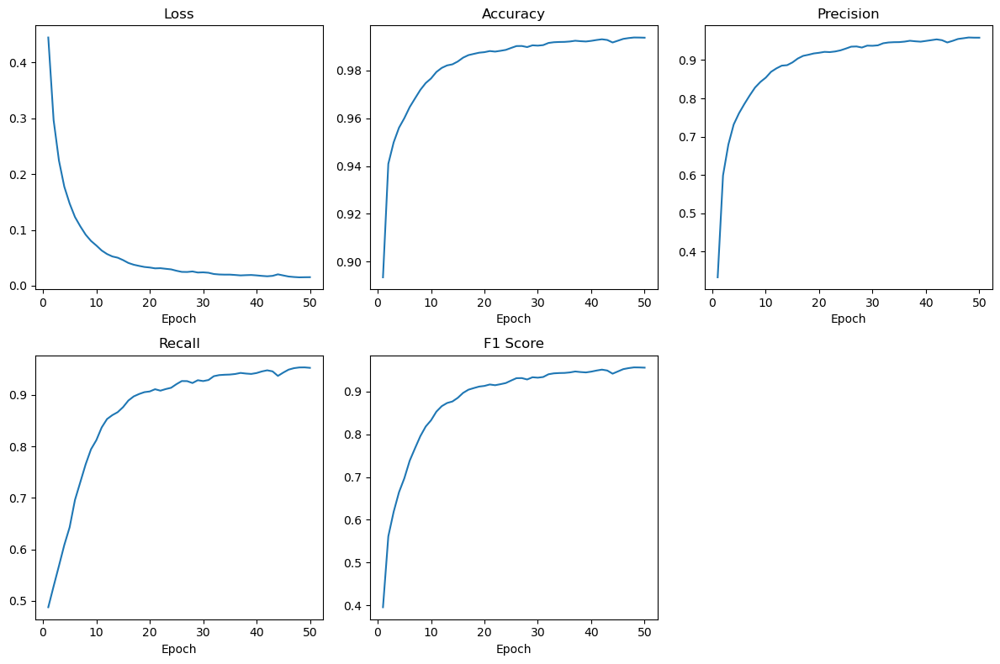

In [18]:
# Model Initialization
model = ViTChangeDetectionModel(hidden_dim=64, layers=(1, 1, 3, 1), heads=(2, 4, 8, 16), embed_dim=56)
#torch.cuda.empty_cache()  # Clear GPU memory

# Train the model
train_model(model, train_loader, val_loader, num_epochs=50, lr=1e-4, device=device)

In [ ]:
# Visualization and Evaluation (unchanged) ## NOT IN USE
def visualize_predictions(model, test_loader, num_samples=5, device='cuda'):
    model.eval()
    transform_to_pil = transforms.ToPILImage()
    all_preds, all_labels = [], []

    with torch.no_grad():
        count = 0
        for img_A_patch, img_B_patch, label_patch in test_loader:
            img_A_patch, img_B_patch, label_patch = (
                img_A_patch.to(device), img_B_patch.to(device), label_patch.to(device)
            )
            label_patch = label_patch.squeeze(1)
            outputs = model(img_A_patch, img_B_patch)
            preds = torch.argmax(outputs, dim=1)

            all_preds.extend(preds.cpu().numpy().flatten())
            all_labels.extend(label_patch.cpu().numpy().flatten())

            img_A_np = img_A_patch.cpu().numpy()
            img_B_np = img_B_patch.cpu().numpy()
            preds_np = preds.cpu().numpy()
            labels_np = label_patch.cpu().numpy()

            for i in range(min(num_samples, img_A_np.shape[0])):
                plt.figure(figsize=(12, 4))
                img_A_pil = transform_to_pil(img_A_np[i])
                img_B_pil = transform_to_pil(img_B_np[i])

                plt.subplot(1, 4, 1)
                plt.imshow(img_A_pil)
                plt.title("Pre-change Image")
                plt.axis("off")

                plt.subplot(1, 4, 2)
                plt.imshow(img_B_pil)
                plt.title("Post-change Image")
                plt.axis("off")

                plt.subplot(1, 4, 3)
                plt.imshow(labels_np[i], cmap="gray")
                plt.title("True Change Mask")
                plt.axis("off")

                plt.subplot(1, 4, 4)
                plt.imshow(preds_np[i], cmap="gray")
                plt.title("Predicted Change Mask")
                plt.axis("off")

                plt.show()
                count += 1
                if count >= num_samples:
                    break

    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, zero_division=0)
    recall = recall_score(all_labels, all_preds, zero_division=0)
    f1 = f1_score(all_labels, all_preds, zero_division=0)

    print(f"\n🔥 Model Evaluation Results:")
    print(f"✅ Accuracy:  {accuracy:.4f}")
    print(f"✅ Precision: {precision:.4f}")
    print(f"✅ Recall:    {recall:.4f}")
    print(f"✅ F1 Score:  {f1:.4f}")


In [21]:
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

In [23]:
# Save model
save_path = "/home/aniketj/mtp2/Model/changeformer_model.pth"
torch.save(model.state_dict(), save_path)
print(f"✅ Model saved successfully at {save_path}")

✅ Model saved successfully at /home/aniketj/mtp2/Model/changeformer_model.pth


In [25]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import torchvision.transforms as transforms
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

def visualize_predictions(model, test_loader, num_samples=5, device='cuda'):
    """
    Runs inference on the test dataset and visualizes predicted vs. true labels.

    Args:
        model (torch.nn.Module): Trained change detection model.
        test_loader (DataLoader): DataLoader for test dataset.
        num_samples (int): Number of images to visualize.
        device (str): Device ('cuda' or 'cpu').
    """
    model.eval()
    transform_to_pil = transforms.ToPILImage()

    all_preds, all_labels = [], []  # Store for metric calculation

    with torch.no_grad():
        count = 0
        for img_A_patch, img_B_patch, label_patch in test_loader:
            img_A_patch, img_B_patch, label_patch = (
                img_A_patch.to(device), img_B_patch.to(device), label_patch.to(device)
            )

            # Convert label (B, 1, H, W) → (B, H, W)
            label_patch = label_patch.squeeze(1)  # Remove single channel for labels

            # Forward pass
            outputs = model(img_A_patch, img_B_patch)  # (B, 2, H, W)

            # Convert logits to binary predictions
            preds = torch.argmax(outputs, dim=1)  # (B, H, W)

            # Flatten tensors for metric computation
            all_preds.extend(preds.cpu().numpy().flatten())
            all_labels.extend(label_patch.cpu().numpy().flatten())

            # Convert tensors to numpy
            img_A_np = img_A_patch.cpu().numpy()
            img_B_np = img_B_patch.cpu().numpy()
            preds_np = preds.cpu().numpy()
            labels_np = label_patch.cpu().numpy()

            # Plot `num_samples` predictions
            for i in range(min(num_samples, img_A_np.shape[0])):
                plt.figure(figsize=(12, 4))

                # Convert images to PIL format properly
                img_A_pil = transform_to_pil(img_A_np[i].transpose(1, 2, 0))  # Convert (C, H, W) → (H, W, C)
                img_B_pil = transform_to_pil(img_B_np[i].transpose(1, 2, 0))

                # Plot Pre-change Image
                plt.subplot(1, 4, 1)
                plt.imshow(img_A_pil)
                plt.title("Pre-change Image")
                plt.axis("off")

                # Plot Post-change Image
                plt.subplot(1, 4, 2)
                plt.imshow(img_B_pil)
                plt.title("Post-change Image")
                plt.axis("off")

                # Plot Ground Truth Label
                plt.subplot(1, 4, 3)
                plt.imshow(labels_np[i], cmap="gray")
                plt.title("True Change Mask")
                plt.axis("off")

                # Plot Model Prediction
                plt.subplot(1, 4, 4)
                plt.imshow(preds_np[i], cmap="gray")
                plt.title("Predicted Change Mask")
                plt.axis("off")

                plt.show()

                count += 1
                if count >= num_samples:
                    break

    # Compute final metrics
    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, zero_division=0)
    recall = recall_score(all_labels, all_preds, zero_division=0)
    f1 = f1_score(all_labels, all_preds, zero_division=0)

    print(f"\n🔥 Model Evaluation Results:")
    print(f"✅ Accuracy:  {accuracy:.4f}")
    print(f"✅ Precision: {precision:.4f}")
    print(f"✅ Recall:    {recall:.4f}")
    print(f"✅ F1 Score:  {f1:.4f}")


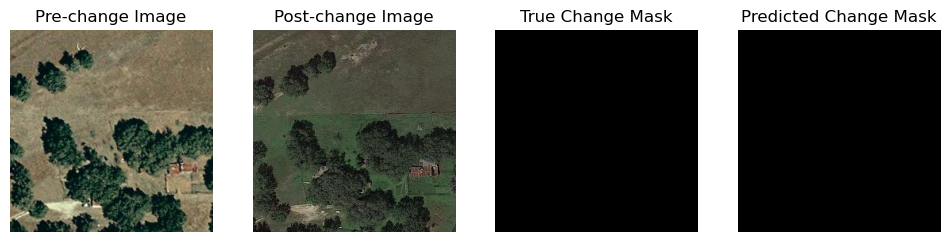

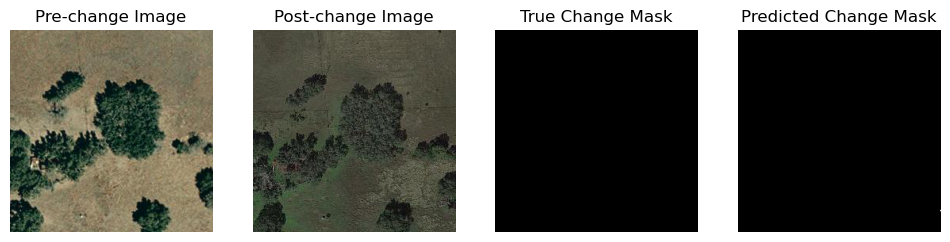

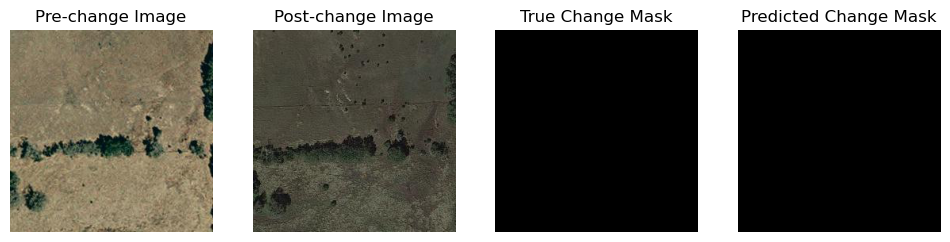

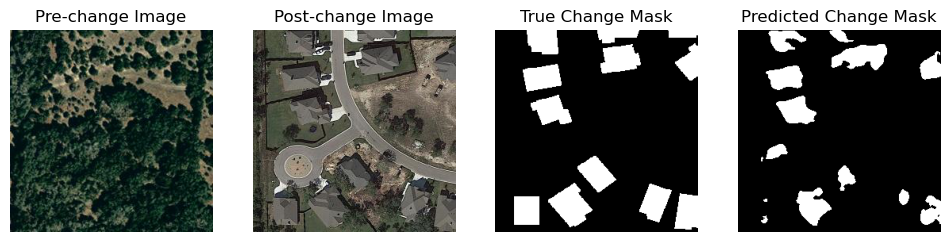

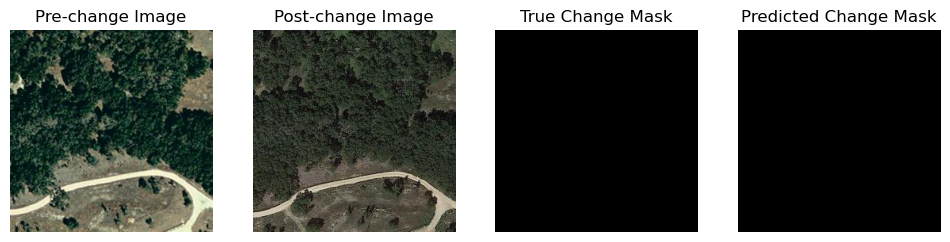

...

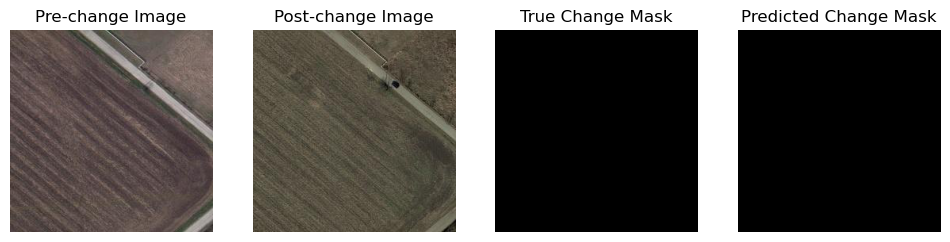

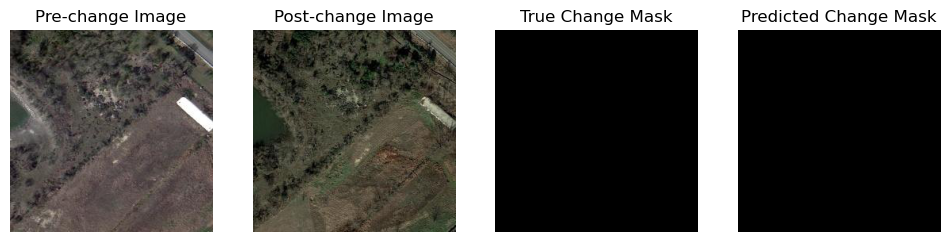

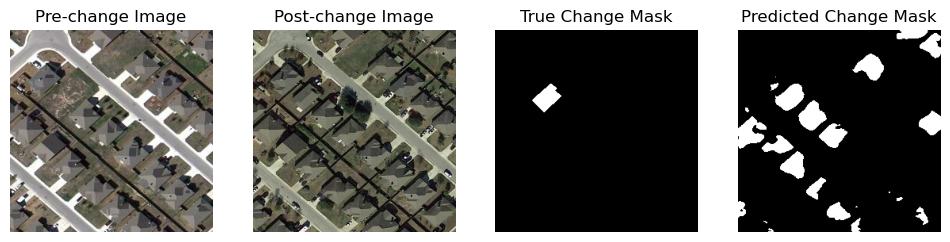

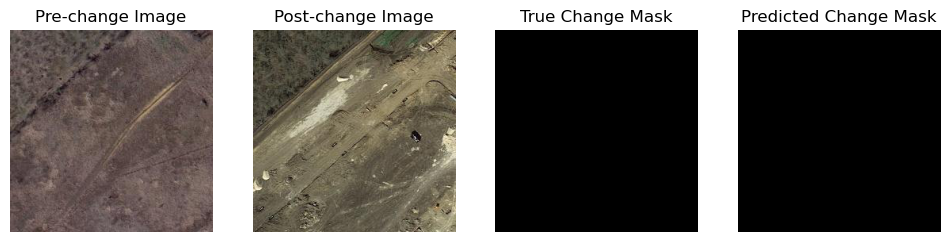

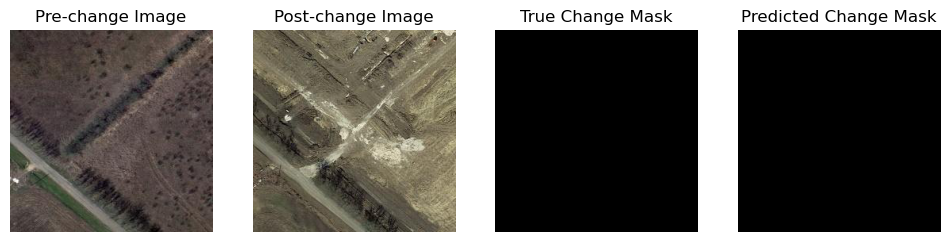


🔥 Model Evaluation Results:
✅ Accuracy:  0.9755
✅ Precision: 0.7443
✅ Recall:    0.6511
✅ F1 Score:  0.6946


In [26]:
# Run visualization
visualize_predictions(model, test_loader, num_samples=5, device=device)